In [1]:
suppressPackageStartupMessages({
    library(SingleCellExperiment)
    # devtools::load_all('/home/zhao/04.Scripts/CAclust/')
    # devtools::load_all('/home/zhao/04.Scripts/APL/')
    library(scran)
    library(dplyr)
    library(ggplot2)
    library(scater)
    library(gridExtra)
    library(ggthemes)
    library(ggsankey)
    library(APL)
    library(plotly)
    source('../Benchmarking/helper_funs.R')
    
    library(CAclust)
    })

ℹ Loading CAclust
ℹ Loading APL


## Load the pre-processed data

In [2]:
## Please first load the preprocessed dataset 'PBMC_10X_filtered.rds' from the online repository to folder Preprocessing//ExperimentalData/preprocessed/ 
## or load to anywhere you want in your local directory and load it as sce
### change the path to you local directory
sce = readRDS('../Preprocessing//ExperimentalData/preprocessed/dmel_E14-16h_filtered.rds')
# sce = readRDS('/project/CAclust/data/CAbiNET_benchmarking_data//pdata/dmel_E14-16h_filtered.rds')

sce

class: SingleCellExperiment 
dim: 7178 14808 
metadata(2): study scDblFinder.stats
assays(2): counts logcounts
rownames(7178): 128up 14-3-3epsilon ... zyd zye
rowData names(2): SYMBOL scDblFinder.selected
colnames(14808): E14-16h_a_S01_20500x62780-0
  E14-16h_a_S01_20500x62800-0 ... E14-16h_a_S16_61760x79380-15
  E14-16h_a_S16_61760x79400-15
colData names(24): slice_ID raw_x ... scDblFinder.mostLikelyOrigin
  scDblFinder.originAmbiguous
reducedDimNames(2): PCA UMAP
mainExpName: NULL
altExpNames(0):

In [3]:
algorithm = 'leiden'
prune = 1/15
resol = 1.2
usegap = NULL
SNN_mode = 'all'
ntop = 2000
truth = 'truth'
dims = 150
NNs = c(60, 10, 10, 10)
graph_select <- TRUE
gcKNN <- TRUE
overlap <- 0.1
nclust = NULL

data = sce

  if (!is.na(ntop)){

        genevars <- modelGeneVar(data, assay.type = "logcounts")

        if (isTRUE(graph_select)){

            chosen <- getTopHVGs(genevars, prop = 0.8)

        } else {
            

            chosen <- getTopHVGs(genevars, n = ntop)

        }

        data_old <- data
        data <- data[rownames(data) %in% chosen,]
    }
    
    # rename rows of data as gene AYMBOL
    rowData(data)$ENSMBL = rownames(data)
    rowData(data)$GeneName = rowData(data)$SYMBOL
    idx = which(is.na(rowData(data)$GeneName ))
    rowData(data)$GeneName[idx] = rownames(rowData(data))[idx]
    rownames(data) = rowData(data)$GeneName

    
    cnts <- as.matrix(logcounts(data))


    trueclusters = colData(data)[,colnames(colData(data)) == truth]


## Correspondence Analysis

In [4]:
#use logcounts as input of cacomp

caobj = cacomp(cnts,
               dims = dims,
               ntop = nrow(cnts),
               python = TRUE, 
              clip = TRUE)

prinInertia <- caobj@D^2
    percentInertia <- prinInertia / sum(prinInertia) * 100

    # Saving the results
    ca <- caobj@std_coords_cols
    attr(ca, "prin_coords_rows") <- caobj@prin_coords_rows
    attr(ca, "singval") <- caobj@D
    attr(ca, "percInertia") <- percentInertia
    attr(ca, "params") <- caobj@params
    
    SingleCellExperiment::reducedDim(data, "CA") <- ca

Warning message in run_cacomp(obj = obj, coords = coords, princ_coords = princ_coords, :
“
Parameter top is >nrow(obj) and therefore ignored.”


## Run the CAbiNet biclustering algorithm with function 'caclust'

In [5]:
# library(APL)
# devtools::load_all('/home/zhao/04.Scripts/APL')
# NNs = as.numeric(item$NNs)

data <- caclust(obj = data,
              k = NNs,
              loops = FALSE,
              SNN_prune = prune,
              mode = SNN_mode,
              select_genes = graph_select,
                resolution = resol,
              prune_overlap = TRUE,
              overlap = overlap,
              calc_gene_cell_kNN = gcKNN,
              algorithm = 'leiden')

In [6]:
ARI = mclust::adjustedRandIndex(data$caclust, data$truth)
ARI

[1] 0.3080897

## Old fashioned joint visualization of cells and genes by CA biplot 

Warning message in ggplot2::geom_point(data = rows, ggplot2::aes_(x = as.name(rnmx), :
“Ignoring unknown aesthetics: text”
Warning message in ggplot2::geom_point(data = cols, ggplot2::aes_(x = as.name(cnmx), :
“Ignoring unknown aesthetics: text”


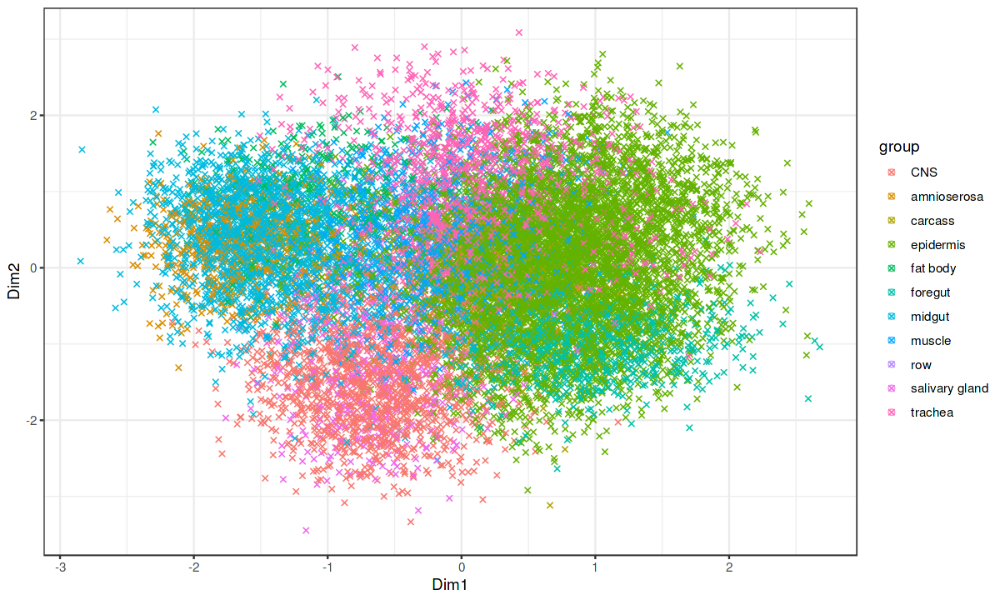

In [7]:
options(repr.plot.width=10, repr.plot.height=6)

clist = data$truth
names(clist) = colnames(data)

ca_biplot(caobj, col_metadata = clist)

In [8]:
# metadata(data)$caclust

In [9]:
# devtools::load_all('/home/zhao/04.Scripts/CAclust')

subdata = rm_monoclusters(data, subset_sce = TRUE)
dim(data)
dim(subdata)
subdata = subdata[!duplicated(rownames(subdata)),]

metadata(subdata)$caclust

[1]   483 14808

[1]   483 14547

caclust object with 14808 cells and 214 genes.
13 clusters found.
Clustering results:

 cluster ncells ngenes
 1       3828    2    
 2       1724   12    
 3       1280   32    
 4       1194   11    
 5       1127   14    
 6       1060    9    
 7       1000   14    
 8        871    6    
 9        850   13    
 10       530   11    
 11       519   13    
 12       284   41    
 13       280    6    

## Figure 5a: UMAP visualization of cells - the old way of visualizing scRNA-seq data
### UMAP with expert annotated cell types (left) and biclustering results (right)

Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.
Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.


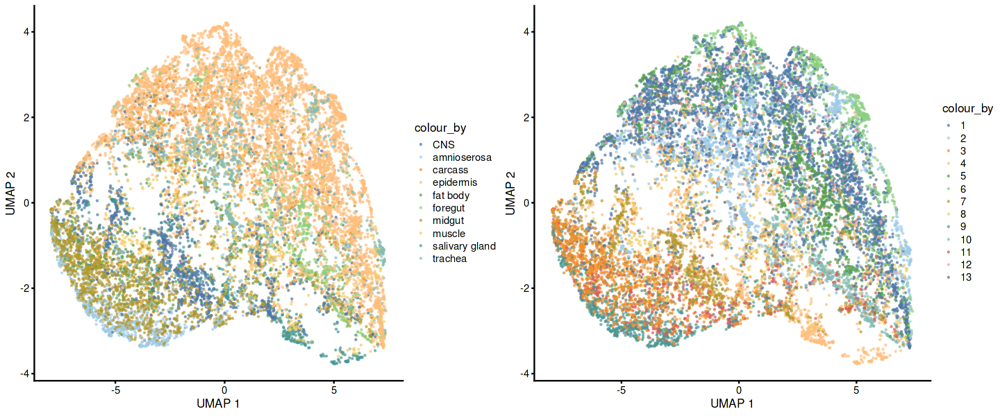

In [10]:
options(repr.plot.width=12, repr.plot.height=5)
library(gridExtra)
# p1 = plotPCA(data, colour_by = 'truth')
p1 = plotUMAP(subdata, colour_by = 'truth',  point_size = 0.2) + scale_color_tableau(
  palette = "Tableau 20",
  type = "regular",
  direction = 1
)

p2 = plotUMAP(subdata, colour_by = 'caclust', point_size = 0.2) + scale_color_tableau(
  palette = "Tableau 20",
  type = "regular",
  direction = 1
)

p = grid.arrange(p1, p2, nrow = 1)

## Figure 5b: biMAP - a joint visualization of cells and corresponding 'marker' genes
### The biMAPs with expert annotated cell types (on the left) and the biclustering results (on the right)

Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.
Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.
Scale for fill is already present.
Adding another scale for fill, which will replace the existing scale.
Warning message:
“ggrepel: 139 unlabeled data points (too many overlaps). Consider increasing max.overlaps”
Warning message:
“ggrepel: 139 unlabeled data points (too many overlaps). Consider increasing max.overlaps”


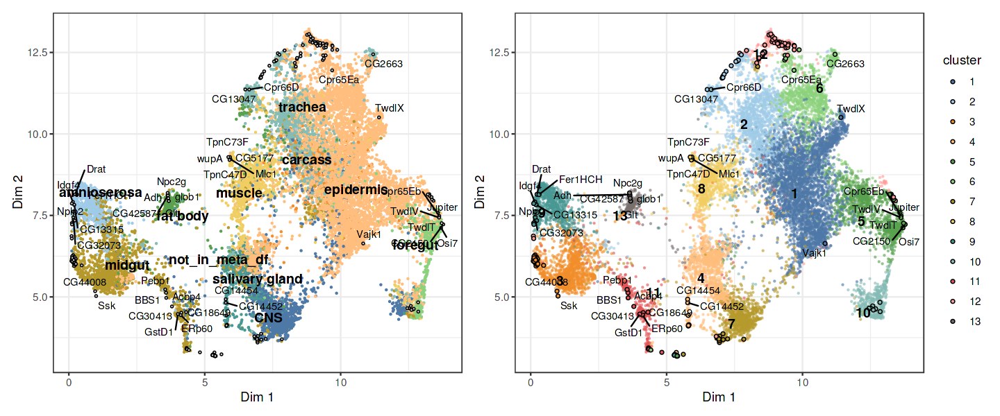

In [11]:
subdata = biMAP(subdata, k = 10, method = 'SNNdist')

p1 = plot_biMAP(subdata,  color_by = 'truth', color_genes = TRUE, label_groups = TRUE,
                 label_marker_genes = TRUE,
                cell_size = 0.2, gene_size = 0.5, cell_alpha = 1, gene_alpha = 1 ) + 
        theme(legend.position = 'none') + 
        scale_color_tableau(
                                      palette = "Tableau 20",
                                      type = "regular",
                                      direction = 1)
p2 = plot_biMAP(subdata,  color_by = 'cluster', color_genes = TRUE,
                 label_marker_genes = TRUE,
               cell_size = 0.2, gene_size = 1, cell_alpha = 0.5, gene_alpha = 1 ) +
    # theme(legend.position = 'none')+ 
        scale_color_tableau(palette = "Tableau 20",
                                      type = "regular",
                                      direction = 1) + 
        scale_fill_tableau(palette = "Tableau 20",
                                      type = "regular",
                                      direction = 1)

p1 + p2

## New annotation of the biclusters

In [12]:
subdata$CAbiNet = as.numeric(subdata$caclust)
subdata$CAbiNet[subdata$CAbiNet == 1] = 'epidermis'
subdata$CAbiNet[subdata$CAbiNet == 6] = 'dorsal epidermis'
subdata$CAbiNet[subdata$CAbiNet == 13] = 'ventral epidermis'

subdata$CAbiNet[subdata$CAbiNet == 2] = 'trachea'
subdata$CAbiNet[subdata$CAbiNet == 3] = 'midgut'
subdata$CAbiNet[subdata$CAbiNet == 9] = 'yolk'
subdata$CAbiNet[subdata$CAbiNet == 11] = 'gastric caecum'

subdata$CAbiNet[subdata$CAbiNet == 7] = 'CNS'
subdata$CAbiNet[subdata$CAbiNet == 4] = 'salivary gland'
subdata$CAbiNet[subdata$CAbiNet == 8] = 'somatic muscle'
# subdata$CAbiNet[subdata$CAbiNet %in% c( 10, 15)] = 'amnoioserosa'
subdata$CAbiNet[subdata$CAbiNet == 10] = 'foregut'
subdata$CAbiNet[subdata$CAbiNet == 5] = 'head epidermis'

subdata$CAbiNet[subdata$CAbiNet == 12] = 'fat body'
mclust::adjustedRandIndex(subdata$CAbiNet, subdata$truth)

[1] 0.3183251

## Figure 5d: Sankey Plot shows the overlapping between the cell-type annotations from original publication, the biclustering results and the new cell-type annotations

Warning message:
“attributes are not identical across measure variables;
they will be dropped”
`summarise()` has grouped output by 'Biclusters', 'Truth'. You can override
using the `.groups` argument.


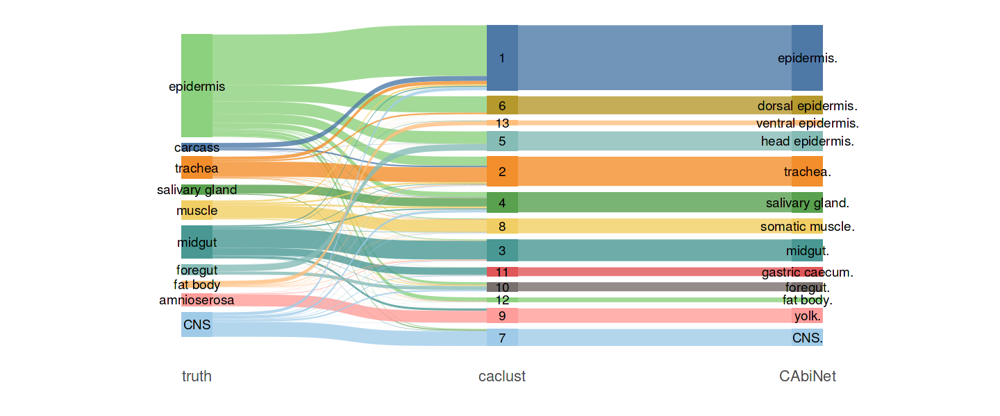

In [13]:
coldf = colData(subdata)
coldf$CAbiNet = paste0(coldf$CAbiNet, '.')
# coldf$caclust = paste0('CAbiNet ', coldf$caclust)

df <- coldf %>% as_tibble() %>% dplyr::select(truth, caclust, CAbiNet) %>%
    # make_long(bicluster, annotation)
    make_long(truth, caclust, CAbiNet)

info  <-  data.frame(Biclusters = as.factor(coldf$caclust),
                  Truth = as.character(coldf$truth),
                    Annotation = as.character(coldf$CAbiNet)) %>%  
                as_tibble() %>%
                group_by(Biclusters, Truth, Annotation) %>% 
                summarise(n = n()) %>%
                group_by(Truth) %>%
                mutate(Partition = n/sum(n)) %>%
                dplyr::select(-c(n)) %>%
                ungroup() %>% 
                as.data.frame() %>% 
                group_by(Biclusters, Annotation) %>%
                filter(Partition == max(Partition) ) %>%
                dplyr::select(Biclusters, Truth, Annotation) %>%
                distinct(Biclusters, .keep_all = TRUE)


cts <- unique(coldf$CAbiNet)
pal <- tableau_color_pal('Tableau 20')
cols <- pal(length(cts))
info <- left_join(data.frame("Annotation" = cts, "col" = cols), info, by = "Annotation")
cols <- c(cols, info$col, info$col)
names(cols) <- c(as.character(cts), as.character(info$Biclusters), as.character(info$Truth))



order = c('epidermis', 'carcass',
         'trachea', 'salivary gland',
         'muscle', 'midgut',
         'foregut', 'fat body',
         'amnioserosa', 'CNS',
           '1', 
         '6',
         '13',
         '5', 
         '2', 
         '4', 
         '8', 
         '3', 
         '11', 
         '10', 
         '12', 
         '9', 
         '7', 
          'epidermis.',
          'dorsal epidermis.',
          'ventral epidermis.',
          'head epidermis.',
         'trachea.', 'salivary gland.',
         'somatic muscle.', 'midgut.',
          'gastric caecum.',
         'foregut.', 'fat body.',
         'yolk.', 'CNS.'
         )

order = order[seq(to = 1, by = -1, length.out = length(order))]

wrap <- length(order)
df$node <- factor(stringr::str_wrap(df$node, wrap), levels = stringr::str_wrap(order, wrap))
df$next_node <- factor(stringr::str_wrap(df$next_node, wrap), levels = stringr::str_wrap(order, wrap))

names(cols) <- stringr::str_wrap(names(cols), wrap)

sank <- ggplot(df, aes(x = x, 
               next_x = next_x, 
               node = node, 
               next_node = next_node,
               fill = node,
               label = as.character(node))) +
  geom_sankey(flow.alpha = 0.8) +
  # geom_sankey_label(size = 2, color = "black",  hjust = -1)+ #fill= "white",
  geom_sankey_text() +
# geom_sankey_text(size = 3, color = "black", fill = NA, hjust = 0, position = position_nudge(x = 0.1))+
  labs(x = "") +
  scale_fill_manual(values = cols) +
  theme_sankey(base_size = 16) +
  theme(legend.position = "none") 
sank


## Figure 5e: Spatial 3D visualization of cells with new cell type annotations

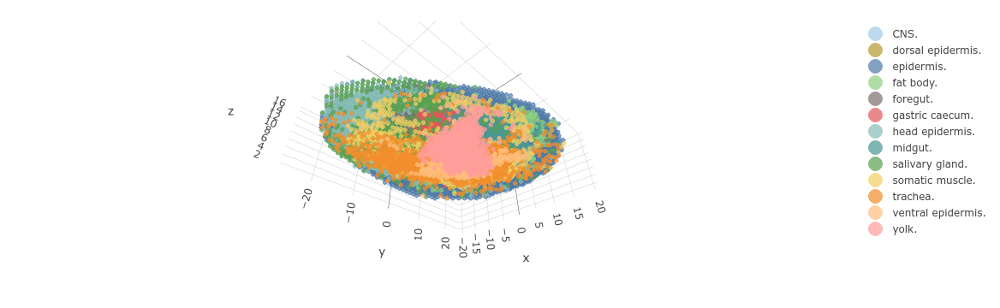

In [14]:

anno_cols = cols[which(names(cols) %in% paste0(unique(subdata$CAbiNet), '.'))]
anno = subdata$CAbiNet
anno = paste0(anno, '.')
                  
p =plot_ly(x = subdata$new_x, 
           y= subdata$new_y, 
           frame = F, 
           z=subdata$new_z,  
           color = anno,
           colors = anno_cols,
           type="scatter3d", 
           mode = 'markers' , 
           alpha = 1, 
           size = 2) %>% layout(scene = list(camera = list(eye = list(x =1.2,y = -1.2, z= -1.2),
                                              center = list(x = 0,
                                                            y = 0,
                                                            z = 0
                                                            ))))
# htmlwidgets::saveWidget(as_widget(p), "3dscatter_annotation_.html")
p

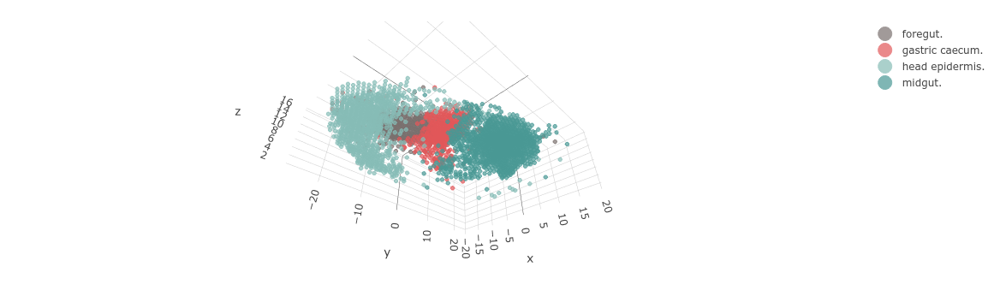

In [15]:
samples = c('head epidermis.', 'foregut.', 'gastric caecum.', 'midgut.')
p =plot_ly(x = subdata[,anno %in% samples]$new_x, 
           y= subdata[,anno %in% samples]$new_y, 
           frame = F, 
           z=subdata[,anno %in% samples]$new_z,  
           color = anno[which(anno %in% samples)],
           colors = anno_cols[names(anno_cols) %in% samples],
           type="scatter3d", 
           mode = 'markers' , 
           alpha = 1, 
           size = 1) %>% layout(scene = list(camera = list(eye = list(x =1.2,y = -1.2, z= -1.2),
                                              center = list(x = 0,
                                                            y = 0,
                                                            z = 0
                                                            ))))
p
# htmlwidgets::saveWidget(as_widget(p),  "3dscatter_annotation_sub_.html")
# plotly::orca(p = p, file = "3dscatter_annotation_sub.pdf")

## Figure 5c: feture plots/biMAPs of marker genes

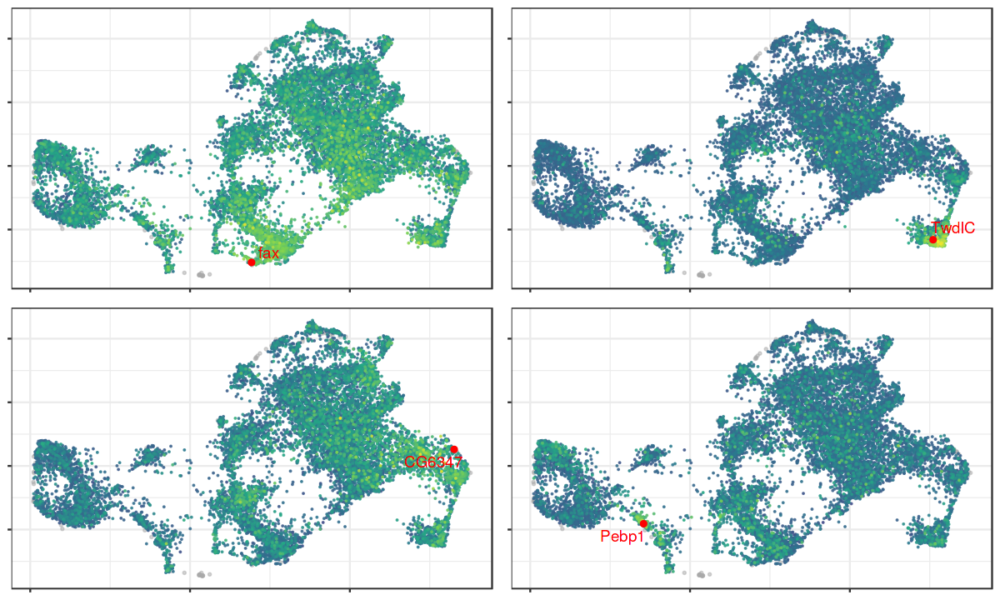

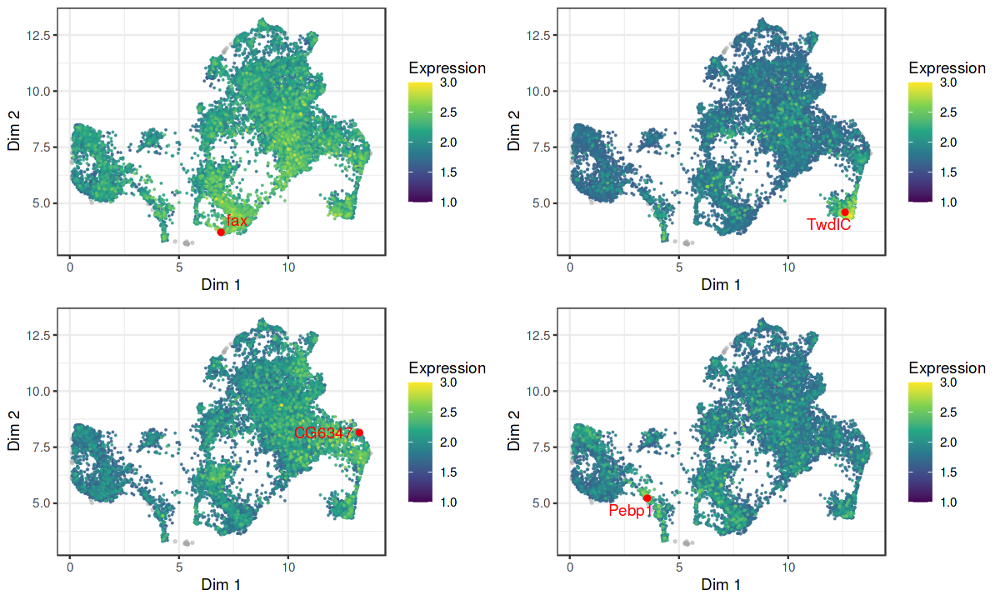

In [16]:
options(repr.plot.width=10, repr.plot.height=6)

p = features_biMAP(subdata, metadata(subdata)$caclust, 
               features = c('fax', 'TwdlC',  'CG6347', 'Pebp1'), 
                   cell_size = 0.05, gene_size = 0.5,
                  show_legend = FALSE,
                   show_labs = FALSE,
                   max_cutoff = 3,
                   min_cutoff = 1,
                  ncol = 2,
                   width = 4,
                   height = 4,
                  filename = NULL)+ 
            theme(legend.position = c(0.8, 0.2), 
                  legend.key.size = unit(0.2, 'cm'))
p = features_biMAP(subdata, metadata(subdata)$caclust, 
               features = c('fax', 'TwdlC',  'CG6347', 'Pebp1'), 
                   cell_size = 0.05, gene_size = 0.5,
                  show_legend = TRUE,
                   min_cutoff = 1,
                   max_cutoff = 3,
                  ncol = 2,
                   width = 6,
                   height = 4,
                  filename = NULL)+ 
            theme(legend.position = c(0.8, 0.2), 
                  legend.key.size = unit(0.2, 'cm'))


Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.


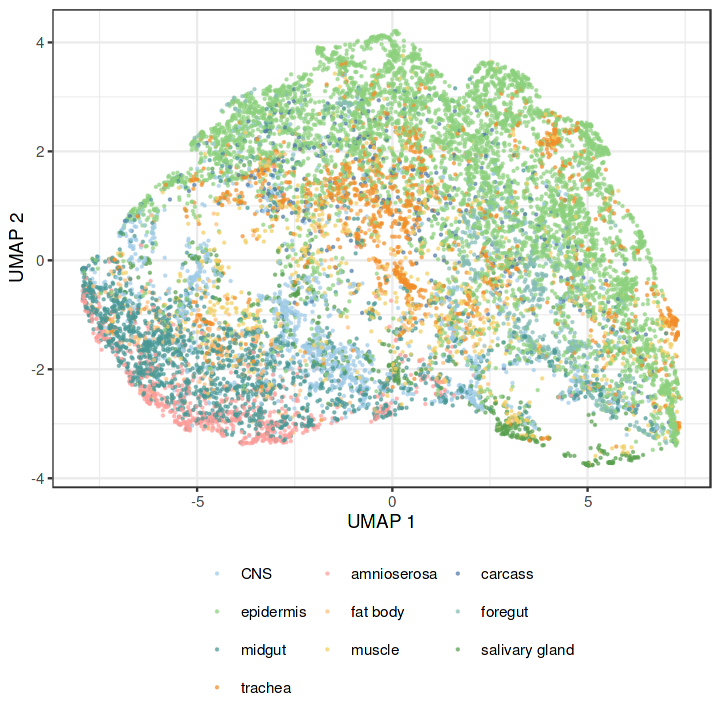

In [17]:
options(repr.plot.width=6, repr.plot.height=6)

truth_cols = cols[names(cols) %in% unique(subdata$truth)]
p1 = plotUMAP(subdata, colour_by = 'truth',  point_size = 0.2)+ theme_bw() + 
                scale_color_manual(values = truth_cols) + 
                theme(legend.position = 'bottom', 
                                                legend.box="vertical",
                                                ) + #legend.text = element_text(size = 6)
                guides(color=guide_legend(title = NULL,nrow=4, byrow=TRUE))
p1

## R environment

In [18]:
sessionInfo()

R version 4.2.1 (2022-06-23)
Platform: x86_64-pc-linux-gnu (64-bit)
Running under: MarIuX64 2.0 GNU/Linux

Matrix products: default
BLAS:   /pkg/R-4.2.1-0/lib/R/lib/libRblas.so
LAPACK: /pkg/R-4.2.1-0/lib/R/lib/libRlapack.so

locale:
 [1] LC_CTYPE=en_US.UTF-8 LC_NUMERIC=C         LC_TIME=C           
 [4] LC_COLLATE=C         LC_MONETARY=C        LC_MESSAGES=C       
 [7] LC_PAPER=C           LC_NAME=C            LC_ADDRESS=C        
[10] LC_TELEPHONE=C       LC_MEASUREMENT=C     LC_IDENTIFICATION=C 

attached base packages:
[1] stats4    stats     graphics  grDevices utils     datasets  methods  
[8] base     

other attached packages:
 [1] plotly_4.10.0               ggsankey_0.0.99999         
 [3] ggthemes_4.2.4              gridExtra_2.3              
 [5] scater_1.24.0               ggplot2_3.4.0              
 [7] dplyr_1.0.10                scran_1.24.1               
 [9] scuttle_1.6.2               APL_0.99.5                 
[11] CAclust_0.99.0              testthat_3.1.4    